In [280]:
import wandb

In [281]:
wandb.login()

wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


True

In [282]:
wandb.init(project="lorenz_lstm", group="Lorenz",save_code=True,notes="Lorenz LSTM run and evaluation")

In [283]:
from torchdiffeq import odeint
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import clear_output
import seaborn as sns

In [534]:
def visualize(real=None, train=None, save=None, title=''):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(1, 1, 1, projection='3d')
    
    ax.set_title('Lorenz Attractor \n'+title)

    if train is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in train])
      z = np.reshape(z, [-1,3])
      sc = ax.scatter(z[:,0], z[:,1], z[:,2], c=z[:,2], cmap='Greens', s=1)
      

    if real is not None:
      sns.set(style='darkgrid')
      
      z = np.array([o.detach().numpy() for o in real])
      z = np.reshape(z, [-1,3])
      ax.scatter(z[:,0], z[:,1], z[:,2], marker='.', color='k', alpha=0.5, linewidths=0, s=45)
     

    fig.canvas.draw()
    fig.canvas.flush_events()
    if save is not None:
        plt.savefig(save+'.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
    plt.show()

In [285]:
class Lorenz(nn.Module):
    """
    chaotic lorenz system
    """
    def __init__(self):
        super(Lorenz, self).__init__()
        self.lin = nn.Linear(5, 3, bias=False)
        W = torch.tensor([[-10., 10., 0., 0., 0.],
                          [28., -1., 0., -1., 0.],
                          [0., 0., -8. / 3., 0., 1.]])
        self.lin.weight = nn.Parameter(W)

    def forward(self, t, x):
        y = y = torch.ones([1, 5])
        y[0][0] = x[0][0]
        y[0][1] = x[0][1]
        y[0][2] = x[0][2]
        y[0][3] = x[0][0] * x[0][2]
        y[0][4] = x[0][0] * x[0][1]
        return self.lin(y)

true_y0 = torch.tensor([[1., 0., 0.]])  # initial condition
t = torch.linspace(0., 50., 5000)  # t is from 0 to 25 for 1000 data points

# generating training data
with torch.no_grad():
    data = odeint(Lorenz(), true_y0, t)



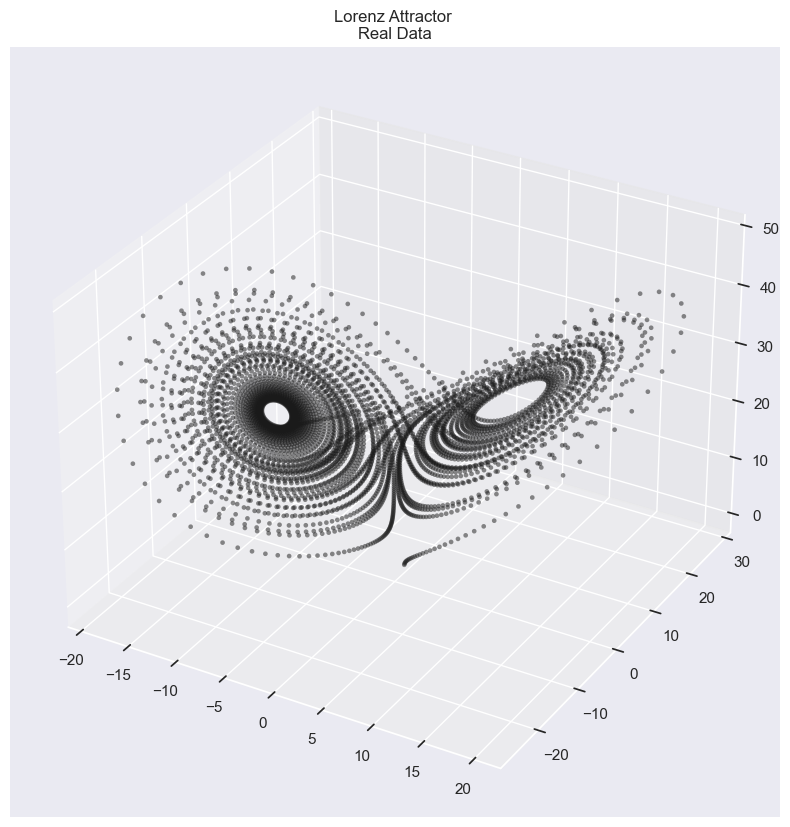

In [286]:
visualize(real=data,save='real',title='Real Data')

In [287]:
torch.manual_seed(7) # Set the random seed
np.random.seed(7) # Set the random seed

In [288]:
# Define the number of random starting points (N)
N = 10  # You can change this to your desired value

# Generate random starting points using NumPy
x0_np = -15 + 30 * np.random.random((N, 3))

# Convert the NumPy array to a PyTorch tensor
x0_tensor = torch.tensor(x0_np, dtype=torch.float32)

In [289]:
x0_tensor

tensor([[-1.2711e+01,  8.3976e+00, -1.8477e+00],
        [ 6.7040e+00,  1.4340e+01,  1.1549e+00],
        [ 3.3614e-02, -1.2838e+01, -6.9468e+00],
        [-3.5250e-03,  5.3769e+00,  9.1122e+00],
        [-3.5718e+00, -1.3022e+01, -6.3556e+00],
        [ 1.2288e+01, -8.5984e+00, -1.4363e+00],
        [ 1.2936e+01, -1.4253e+01,  3.0165e+00],
        [ 1.3504e+01, -8.0909e+00,  1.4547e+00],
        [ 1.2274e+01, -1.1005e+01,  7.0238e-01],
        [ 7.5123e+00,  5.0704e+00, -9.6741e-01]])

In [290]:
# data_list = []
# #num_conditions = 10
# # Generate data for each initial condition and stack them into a single tensor
# conditions = x0_tensor
# for _ in conditions:
#     true_y0 = _  # Random initial condition as a torch tensor
#     t = torch.linspace(0., 50., 5000)  # t is from 0 to 10 for 5000 data points

#     # Generate data for the current initial condition
#     with torch.no_grad():
#         data = odeint(Lorenz(), true_y0.unsqueeze(0), t)  # Unsqueezing to add batch dimension

#     # Append the generated data to the list
#     data_list.append(data)

# # Stack the data tensors along a new dimension to create a single tensor
# data_tensor = torch.stack(data_list)

In [291]:
# torch.save(data_tensor, 'data_tensor.pt')

In [292]:
data_tensor = torch.load('data_tensor.pt')

In [293]:
data_tensor.shape

torch.Size([10, 5000, 1, 3])

In [294]:
train = data_tensor[:6]
val = data_tensor[6]
test = data_tensor[7:]

In [295]:
train = train.view(30000,1,3)

In [296]:
train.shape

torch.Size([30000, 1, 3])

In [297]:
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        # Initialize hidden state with zeros
        h0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(1, x.size(0), self.lstm.hidden_size).to(x.device)

        # Forward pass through LSTM layer
        out, _ = self.lstm(x, (h0, c0))

        # Reshape output for the fully connected layer
        #out = out[:, -1, :]

        # Fully connected layer
        out = self.fc(out)

        return out

# Define input size, hidden size, and output size
input_size = 3
hidden_size = 512
output_size = 3

# Create an instance of the LSTMModel
model = LSTMModel(input_size, hidden_size, output_size)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters())



In [298]:
def create_dataset(dataset, lookback):
    """Transform a time series into a prediction dataset
    
    Args:
        dataset: A numpy array of time series, first dimension is the time steps
        lookback: Size of window for prediction
    """
    X, y = [], []
    for i in range(len(dataset)-lookback):
        feature = dataset[i:i+lookback]
        target = dataset[i+1:i+lookback+1]
        X.append(feature)
        y.append(target)
    return torch.stack(X).squeeze(2), torch.stack(y).squeeze(1).squeeze(2)
 
lookback = 30
X_train, y_train = create_dataset(train, lookback=lookback)

In [299]:
y_train.shape

torch.Size([29970, 30, 3])

In [300]:
X_train.shape

torch.Size([29970, 30, 3])

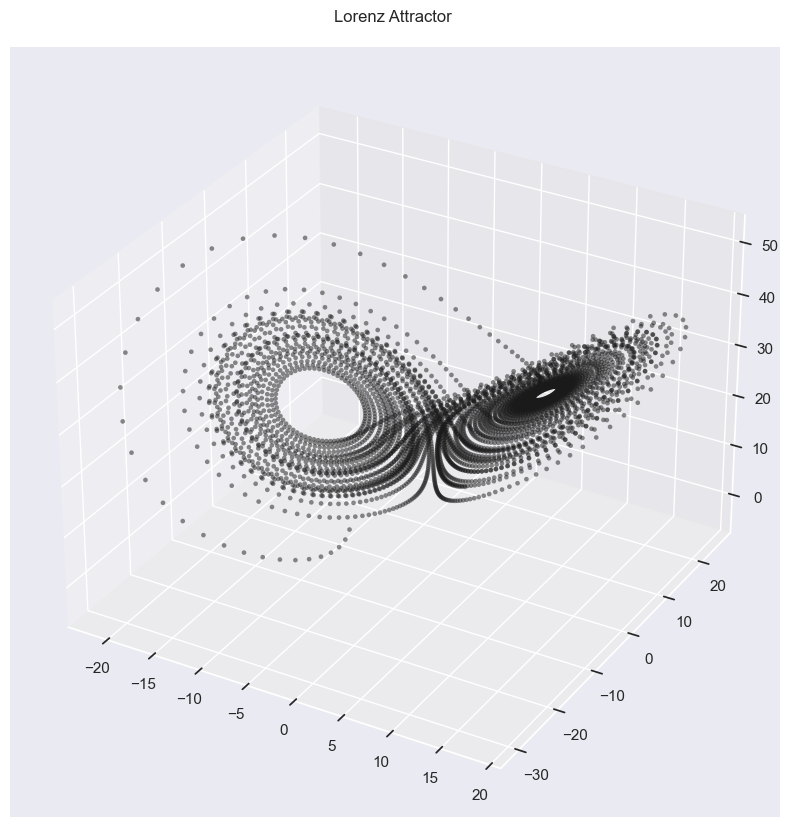

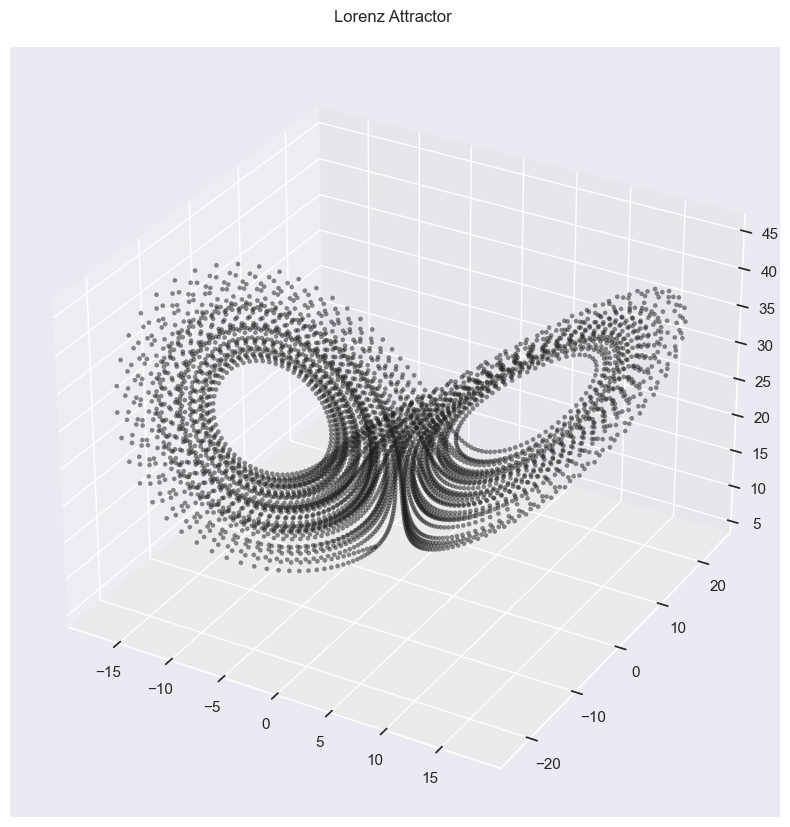

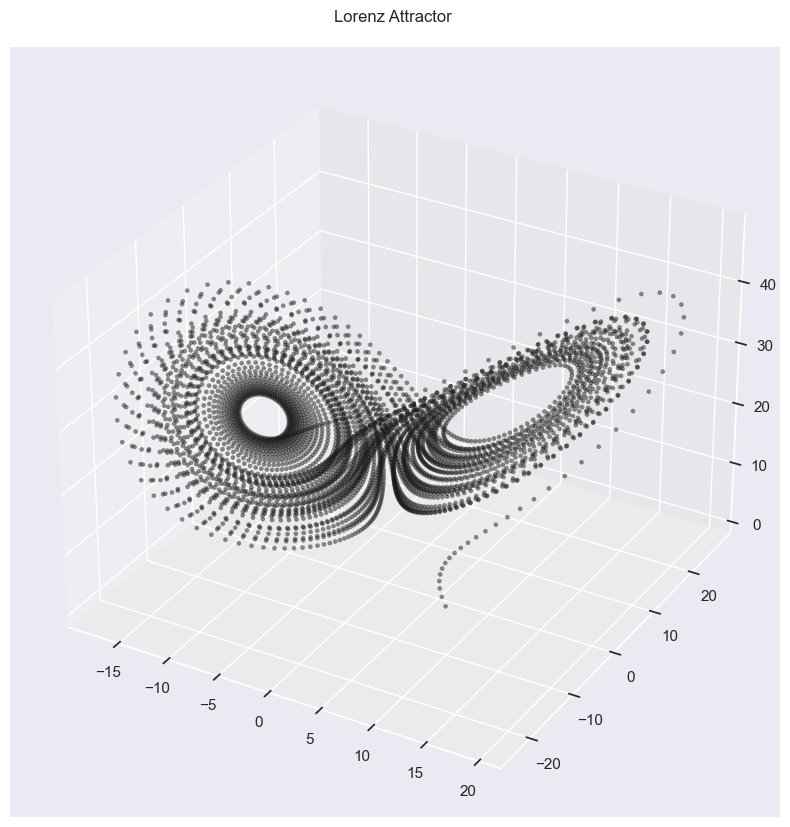

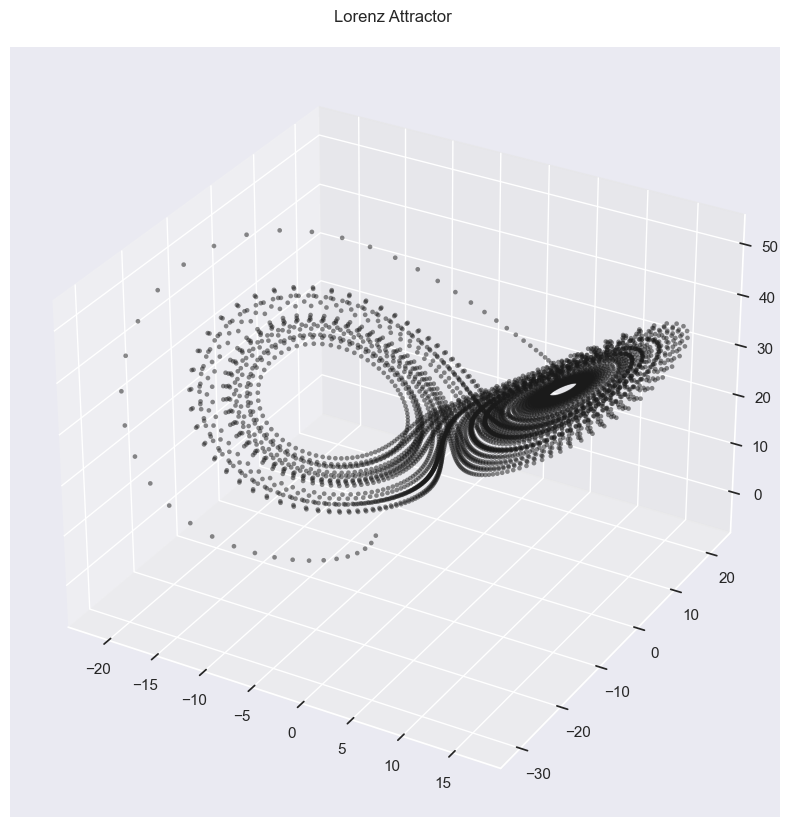

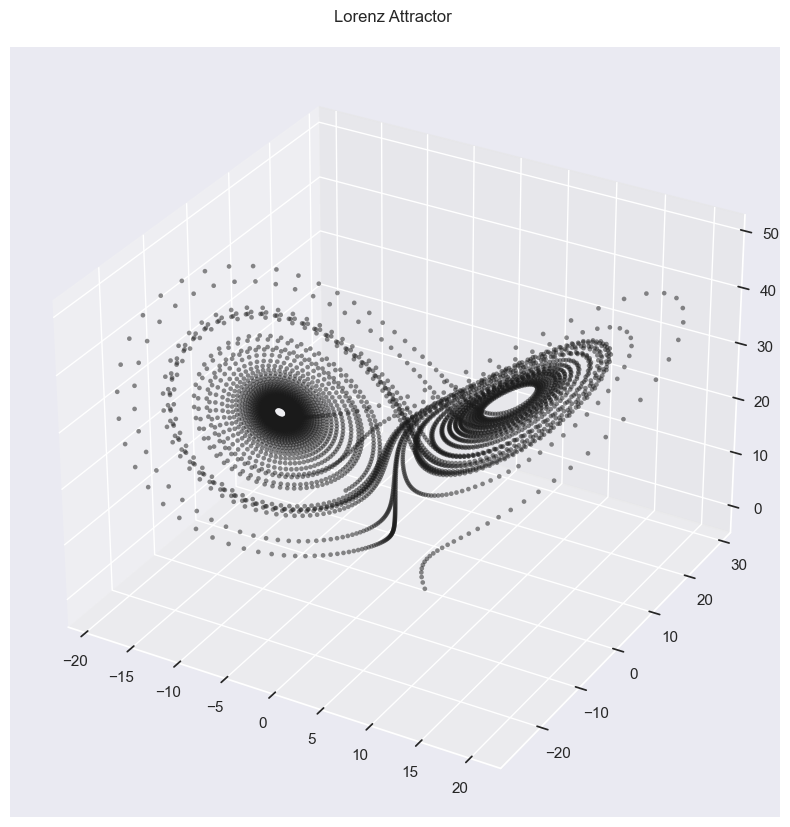

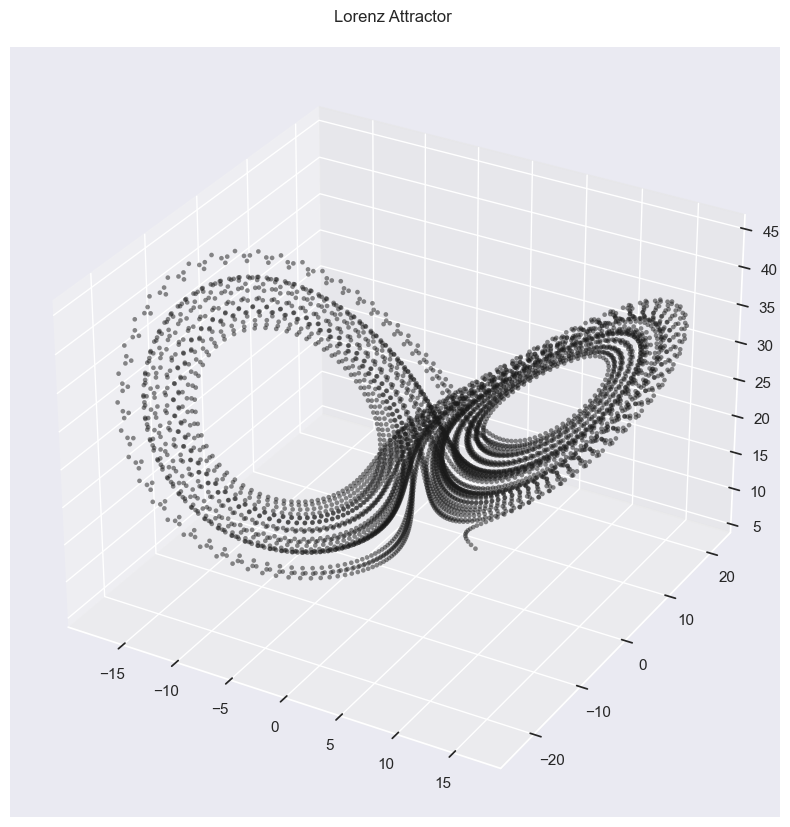

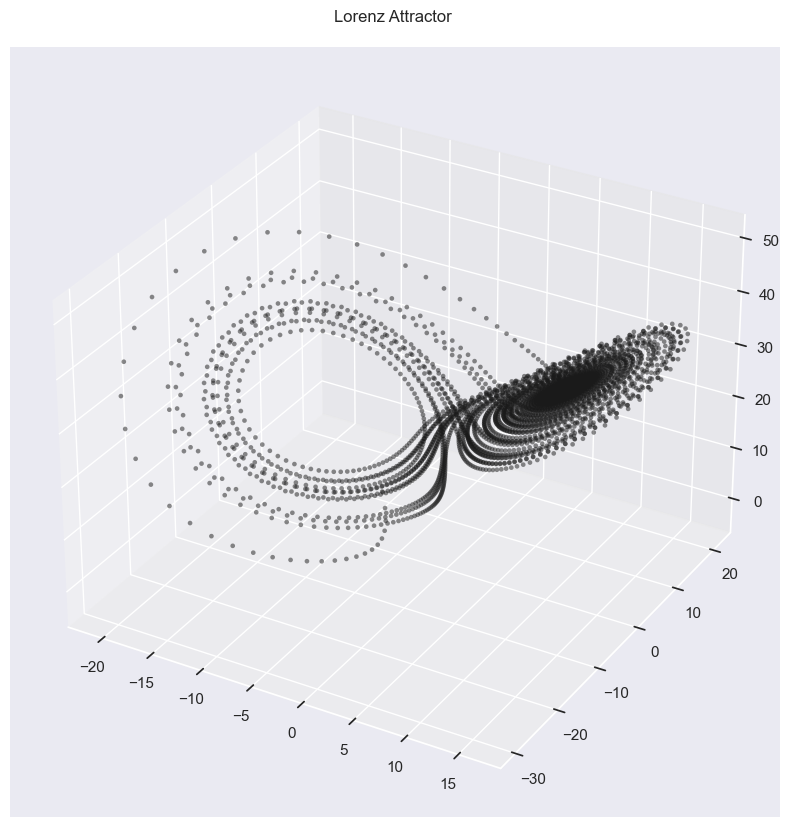

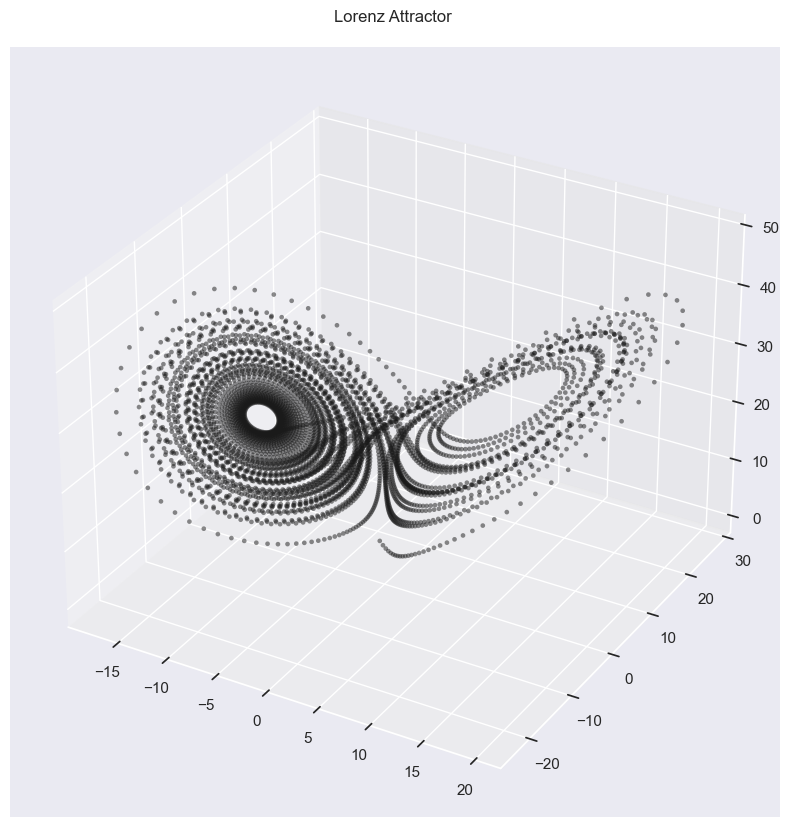

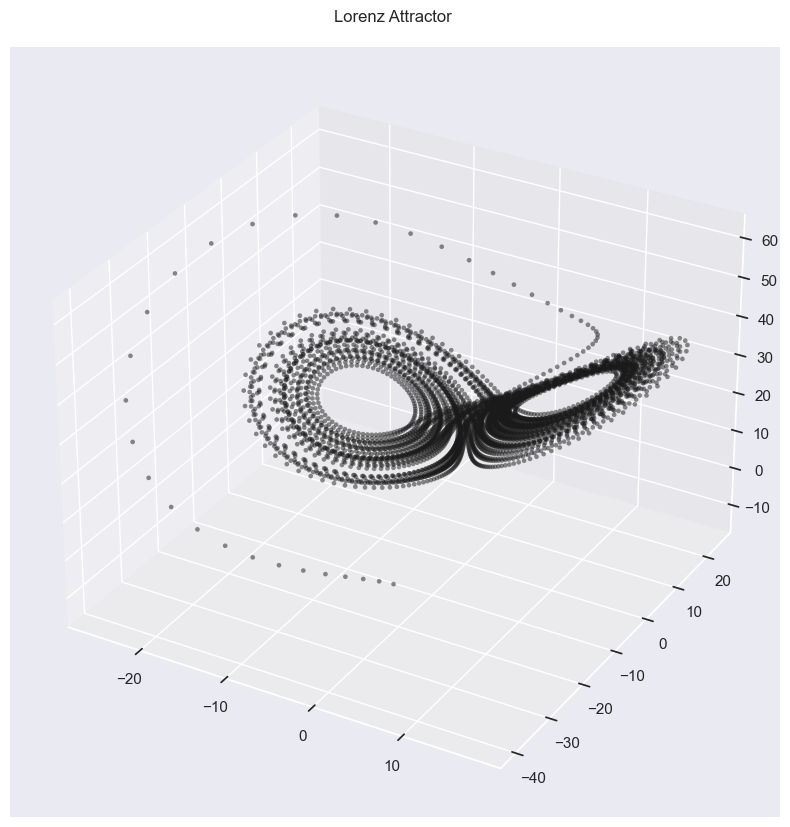

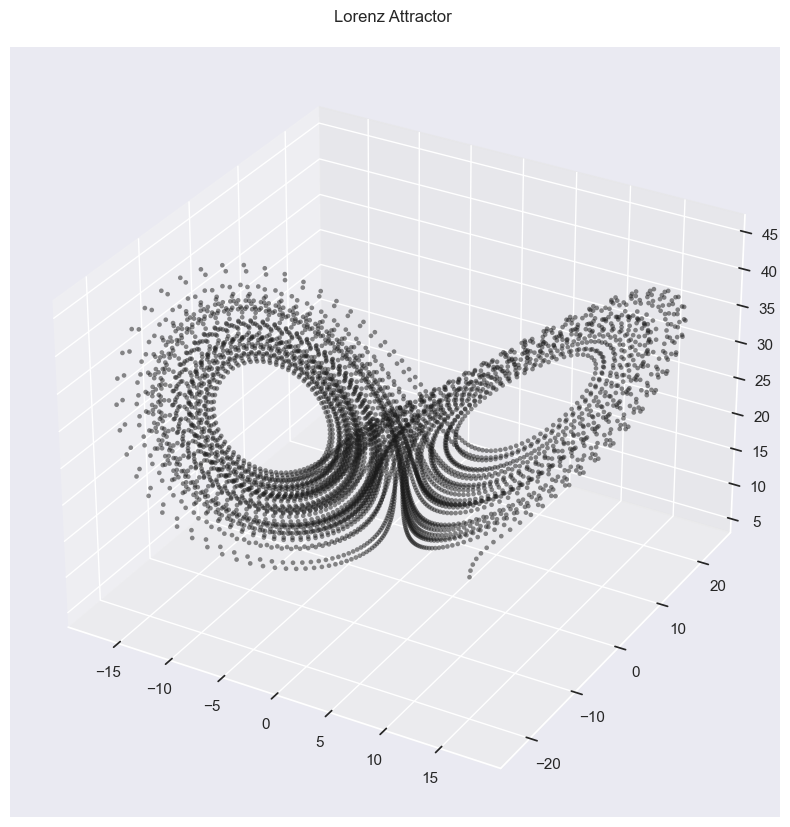

In [301]:
for i in range(len(data_tensor)):
  visualize(real=data_tensor[i])

In [302]:
import torch.utils.data as lon

In [303]:
train_loader = lon.DataLoader(lon.TensorDataset(X_train, y_train), shuffle=False, batch_size=8)

In [304]:
x_val, y_val = create_dataset(val, lookback=lookback)

In [305]:
val_loader = lon.DataLoader(lon.TensorDataset(x_val, y_val), shuffle=False, batch_size=8)

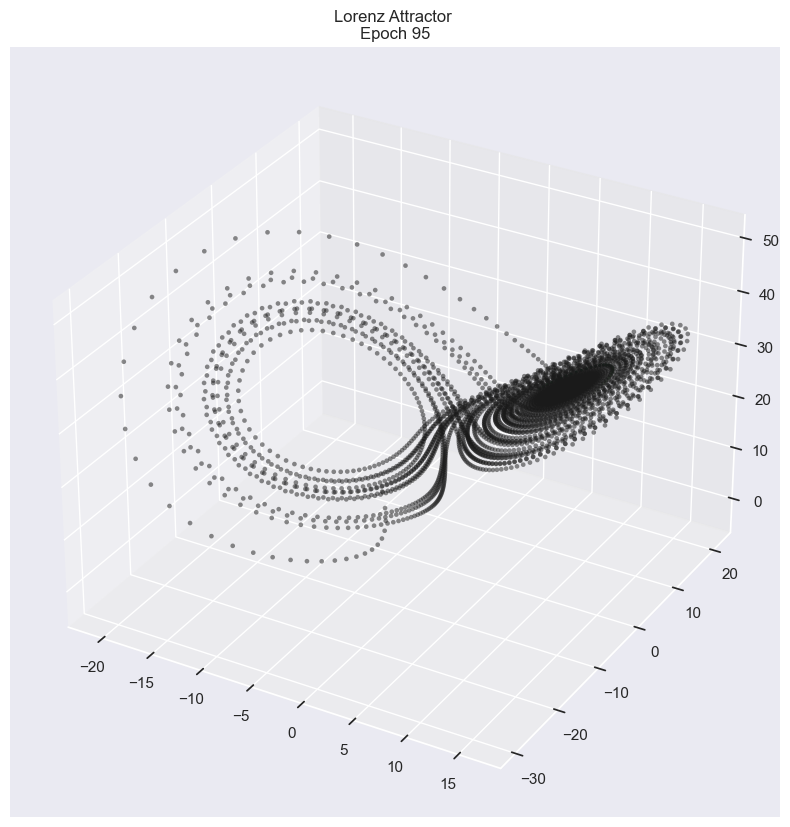

Epoch [96/100], Loss: 0.0043


In [306]:
val_losses = []
epoch_losses = []
num_epochs = 100
best_loss = 1000.
for epoch in range(num_epochs):
    batch_losses = []
    for x,y in train_loader:
        optimizer.zero_grad()
        # Forward pass
        predicted_lorenz = model(x)

        # Compute the loss
        loss = criterion(predicted_lorenz, y)

        # Backpropagation
        loss.backward()
        optimizer.step()
        batch_losses.append(loss.item())
    epoch_loss = np.mean(batch_losses)
    if epoch_loss < best_loss:
        best_loss = epoch_loss
        torch.save(model.state_dict(), 'lorenz_lstm.pt')
    epoch_losses.append(epoch_loss)
    
    if epoch % 5 == 0:
        
        with torch.no_grad():
            val_batch_loss = []
            for x,y in val_loader:
                
                # Forward pass
                predicted_lorenz = model(x)

                # Compute the loss
                loss = criterion(predicted_lorenz, y)
                val_batch_loss.append(loss.item())
            val_losses.append(np.mean(val_batch_loss))
            visualize(real=val, 
                                train=predicted_lorenz,save='PNG/LSTM/{}'.format(epoch),title='Epoch {}'.format(epoch))
            print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
            clear_output(wait=True)


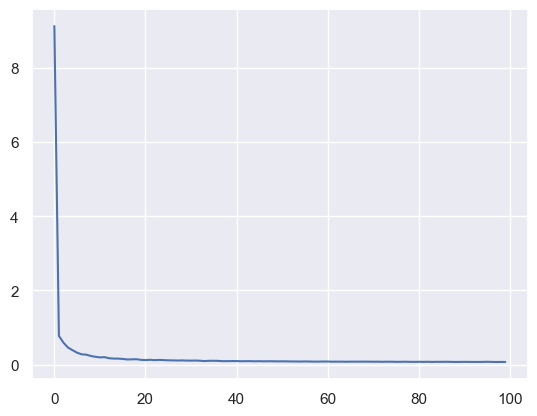

In [374]:
plt.plot(epoch_losses, label='Training loss')
plt.show()

In [375]:
epoch_losses = torch.tensor(epoch_losses)

In [376]:
torch.save(epoch_losses, 'epoch_losses_lstm.pt')

In [377]:
x_test, y_test = create_dataset(test[0], lookback=1)

In [378]:
test_0_loader = lon.DataLoader(lon.TensorDataset(x_test, y_test), shuffle=False, batch_size=1)

In [526]:
test_model = LSTMModel(input_size, hidden_size, output_size)

In [527]:
test_model.load_state_dict(torch.load('lorenz_lstm.pt'))

<All keys matched successfully>

In [425]:
test[0][0].shape

torch.Size([1, 3])

In [488]:
test_losses = []
predictions = []
with torch.no_grad():
            preds = []
            test_batch_loss = []
            preds.append(test[0][0].unsqueeze(0))
            for x,y in test_0_loader:
                
                # Forward pass
                predicted_lorenz = test_model(x)
                preds.append(predicted_lorenz)
                # Compute the loss
                loss = criterion(predicted_lorenz, y)
                test_batch_loss.append(loss.item())
            predictions = torch.stack(preds)
            test_losses.append(np.mean(val_batch_loss))

In [489]:
test_losses

[0.008225957625148776]

In [490]:
test_0_onestep_losses = torch.tensor(test_losses)

In [491]:
torch.save(test_0_onestep_losses, 'test_0_onestep_losses_lstm.pt')

In [492]:
predictions.shape

torch.Size([5000, 1, 1, 3])

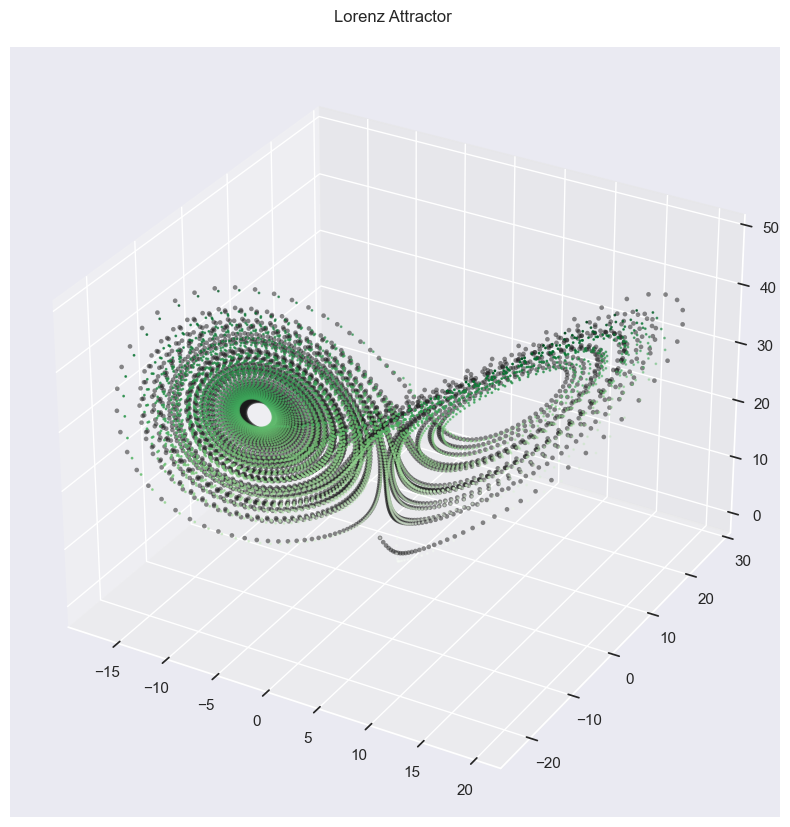

In [493]:
visualize(train=predictions,real=test[0])

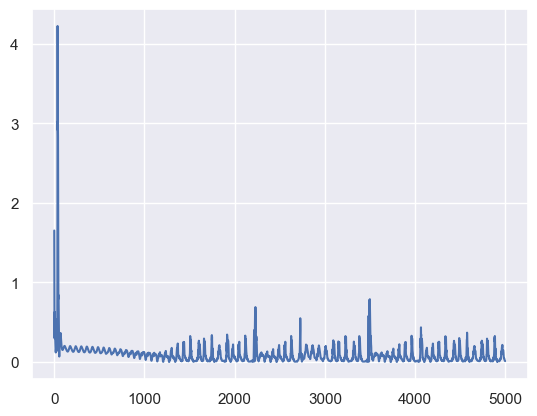

In [449]:
plt.plot(test_batch_loss)
plt.show()

In [441]:
predictions.shape

torch.Size([5000, 1, 1, 3])

In [456]:
x_pred = predictions[:,:,:, 0].squeeze(1)
y_pred = predictions[:,:, :,1].squeeze(1)
z_pred = predictions[:, :,:,2].squeeze(1)

In [457]:
x_train = test[0][:, :, 0]
y_train = test[0][:, :, 1]
z_train = test[0][:, :, 2]

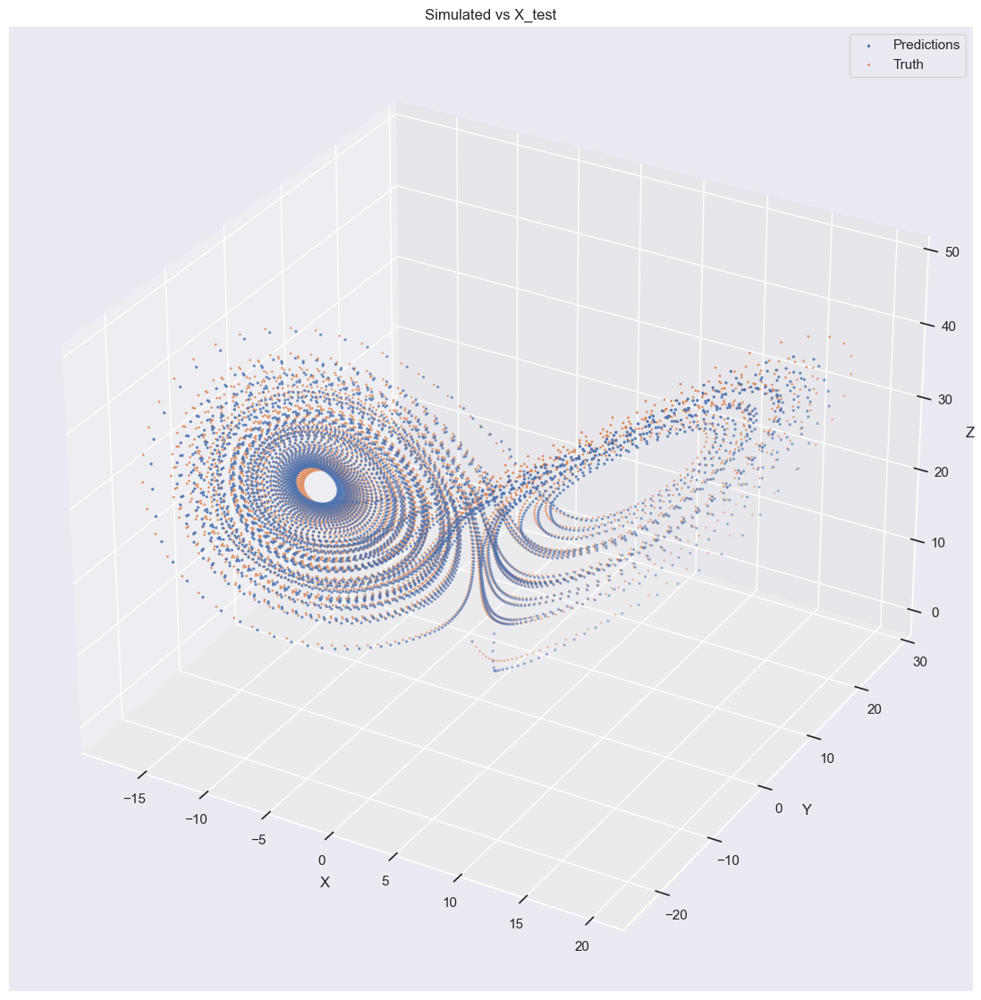

In [458]:
# Create a 3D plot
fig = plt.figure(figsize=(14,14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_pred, y_pred, z_pred, label='Predictions',s=2)
ax.scatter(x_train, y_train, z_train, label='Truth',s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Simulated vs X_test')
ax.legend()

# Show the plot
plt.show()

In [494]:
x_train.shape

torch.Size([5000, 1])

In [495]:
x_pred.shape

torch.Size([5000])

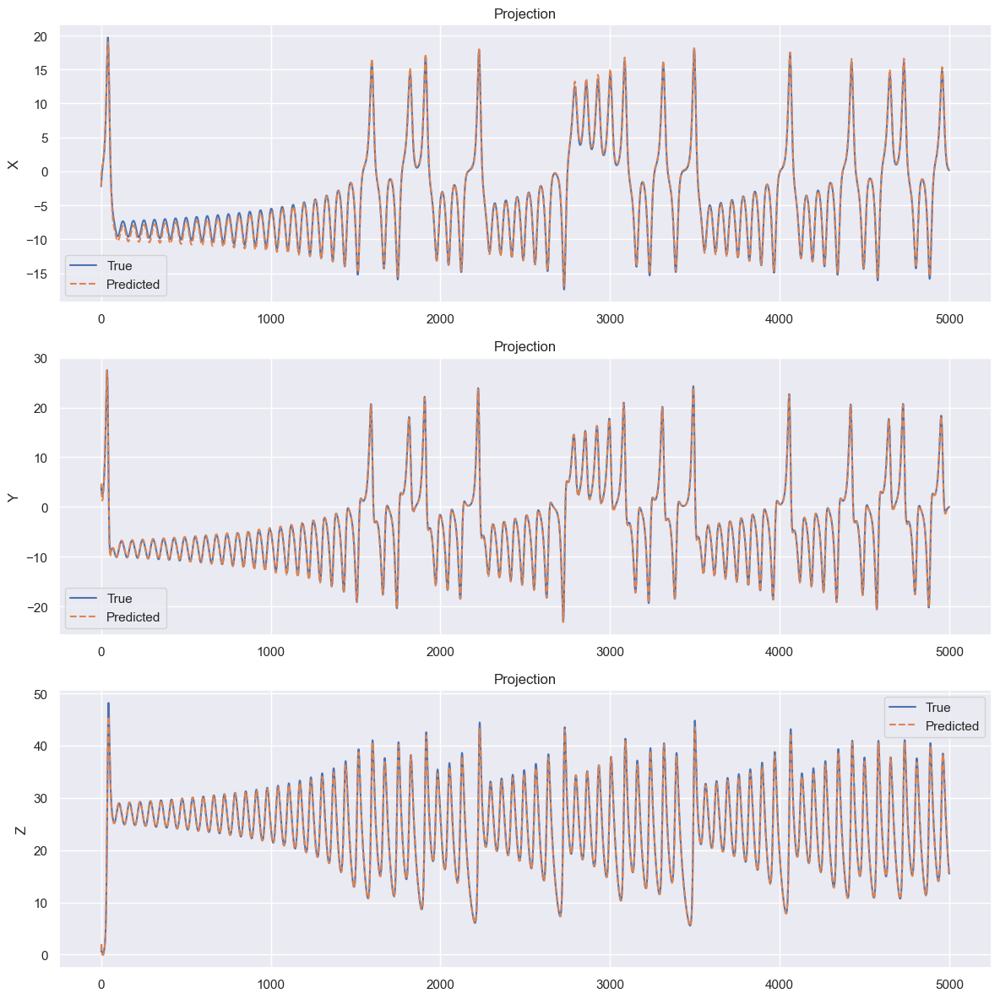

In [459]:
fig, ax = plt.subplots(3, 1, figsize=(12, 12))
ax[0].plot(x_train, label='True')
ax[0].plot(x_pred, label='Predicted',linestyle='--')

ax[0].set_ylabel('X')
#ax[0].set_xlim(0, 1000)
ax[0].set_title('Projection')
ax[0].legend()

ax[1].plot(y_train, label='True')
ax[1].plot(y_pred, label='Predicted',linestyle='--')
ax[1].set_ylabel('Y')
ax[1].set_title('Projection')
ax[1].legend()

ax[2].plot(z_train, label='True')
ax[2].plot(z_pred, label='Predicted',linestyle='--')
ax[2].set_ylabel('Z')
#ax[2].set_xlim(0, 400)
ax[2].set_title('Projection')
ax[2].legend()

plt.tight_layout()
plt.show()

In [629]:
train.shape

torch.Size([30000, 1, 3])

In [648]:
data_tensor[:6].shape

torch.Size([6, 5000, 1, 3])

In [666]:
def evaluate(model,dataset,visualizer=visualize,label=''):
    import torch.utils.data as lon
    test_losses = []
    predictions = []
    out_pred = []
    criterion = nn.MSELoss()
    for i in range(len(dataset)):
        x_test, y_test = create_dataset(dataset[i], lookback=1)
        test_0_loader = lon.DataLoader(lon.TensorDataset(x_test, y_test), shuffle=False, batch_size=1)
        with torch.no_grad():
            preds = []
            test_batch_loss = []

            for x, y in test_0_loader:
                # Get the initial input (first time step)
                input_seq = x[:, 0:1, :]
                break

           
            
            preds.append(input_seq.view(1,3))
            h0 = torch.zeros(1, 1, hidden_size)  
            c0 = torch.zeros(1, 1, hidden_size) 
            for x,y in test_0_loader:
                # Forward pass for the current time step
                out, (h0, c0) = model.lstm(input_seq, (h0, c0))
                predicted_lorenz = model.fc(out[:, -1, :])

                # Append the prediction for this time step to preds
                preds.append(predicted_lorenz)

                # Update the input_seq for the next time step (use the predicted value)
                input_seq = predicted_lorenz.unsqueeze(1)

                # Compute the loss for this time step
                loss = criterion(predicted_lorenz, y.view(1,3))
                test_batch_loss.append(loss.item())
            
            # Stack all the predictions along the time axis
            predictions = torch.stack(preds, dim=1)
            preds = torch.stack(preds, dim=1)
            out_pred.append(preds)
            # Compute the mean loss across all time steps
            test_losses.append(np.mean(test_batch_loss))
            visualizer(train=predictions,real=dataset[i],save='PNG/LSTM/{}'.format(i),title=f'{label}_{i}')
            
            coord = predictions.squeeze(0)
            x_pred = coord[:, 0]
            y_pred = coord[:,1]
            z_pred = coord[:,2]
            
            fig, ax = plt.subplots(3, 1, figsize=(8, 12))
            ax[0].plot(x_train, label='True')
            ax[0].plot(x_pred, label='Predicted',linestyle='--')

            ax[0].set_ylabel('X')
            #ax[0].set_xlim(0, 1000)
            ax[0].set_title('Projection')
            ax[0].legend()

            ax[1].plot(y_train, label='True')
            ax[1].plot(y_pred, label='Predicted',linestyle='--')
            ax[1].set_ylabel('Y')
            ax[1].set_title('Projection')
            ax[1].legend()

            ax[2].plot(z_train, label='True')
            ax[2].plot(z_pred, label='Predicted',linestyle='--')
            ax[2].set_ylabel('Z')
            #ax[2].set_xlim(0, 400)
            ax[2].set_title(f'Projection')
            ax[2].legend()
            
            plt.tight_layout()
            plt.savefig(f'PNG/LSTM/Projection on {label}_{i}th Lorenz.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
            plt.show()
    return out_pred, test_losses

In [630]:
test.shape

torch.Size([3, 5000, 1, 3])

In [653]:
x_test, y_test = create_dataset(test[0], lookback=30)

In [654]:
x_test.shape, y_test.shape

(torch.Size([4970, 30, 3]), torch.Size([4970, 30, 3]))

In [655]:
test_0_loader = lon.DataLoader(lon.TensorDataset(x_test, y_test), shuffle=False, batch_size=1)

In [656]:
for m,n in test_0_loader:
  print(m.shape,n.shape)
  break

torch.Size([1, 30, 3]) torch.Size([1, 30, 3])


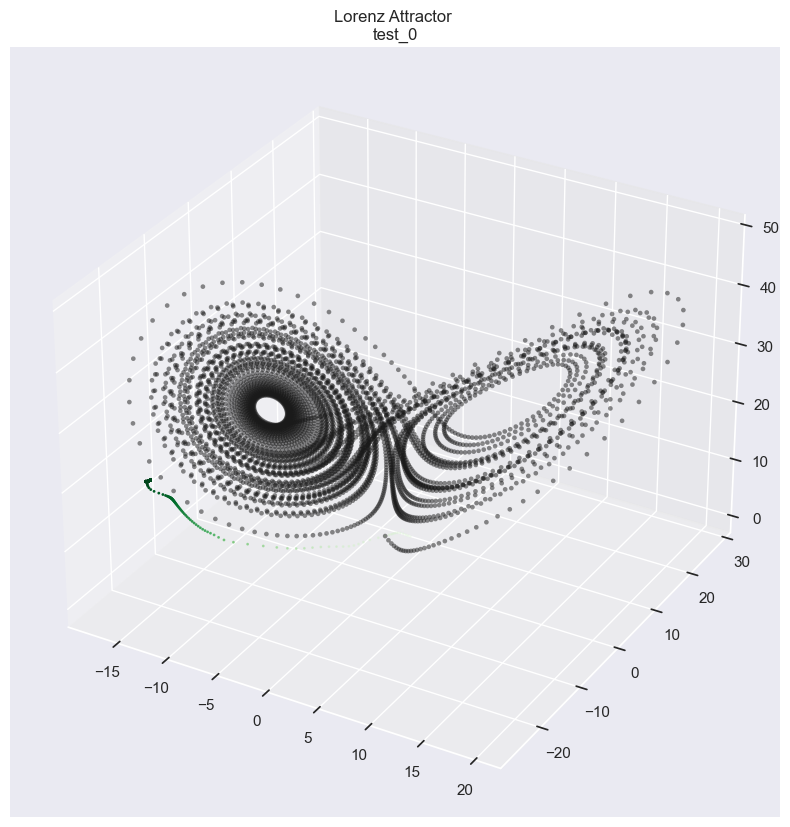

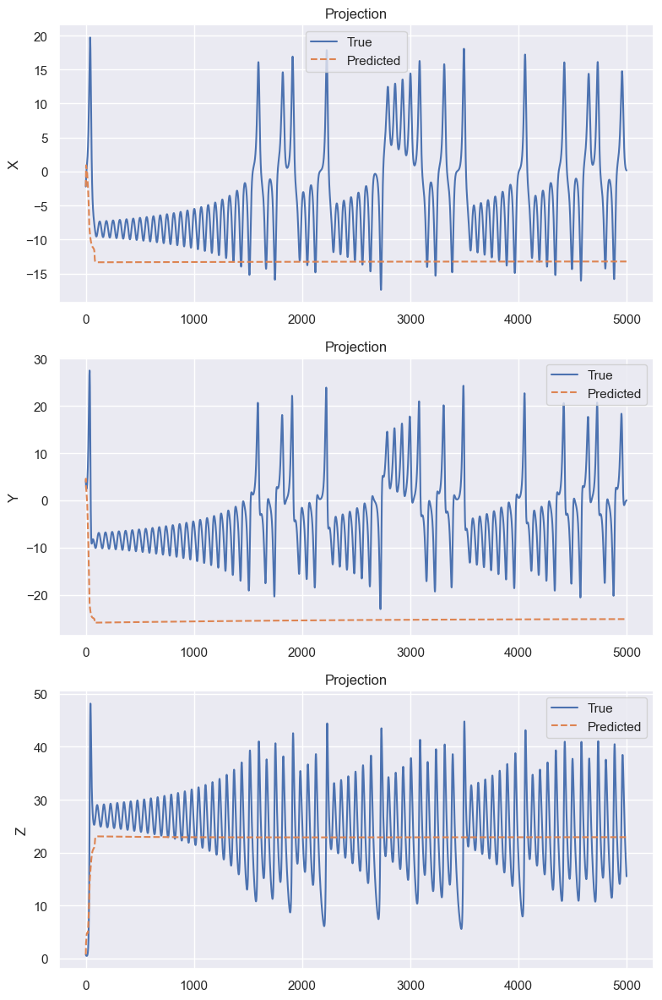

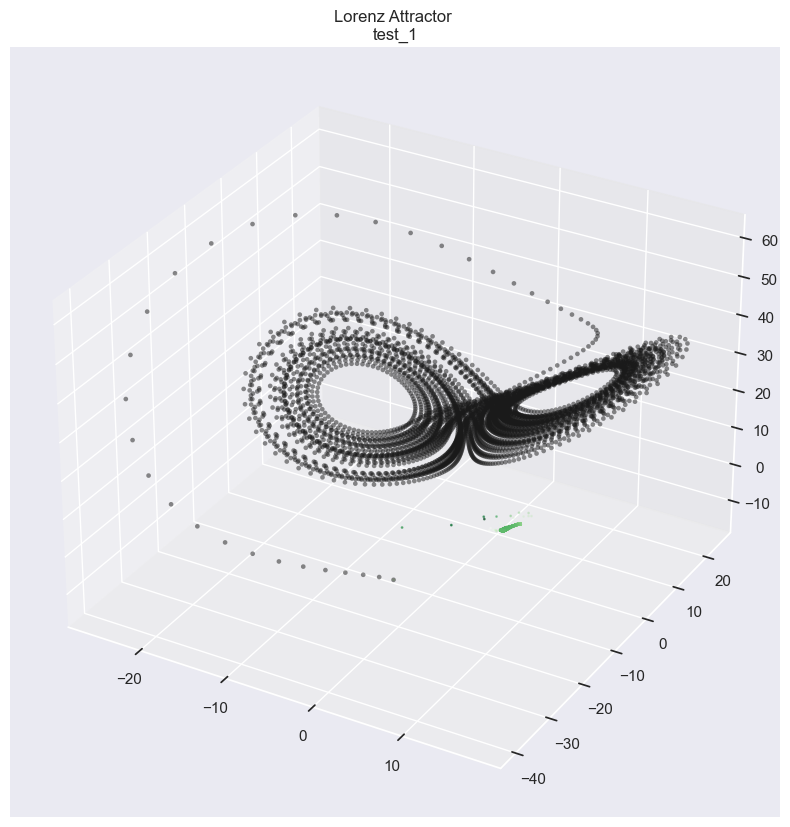

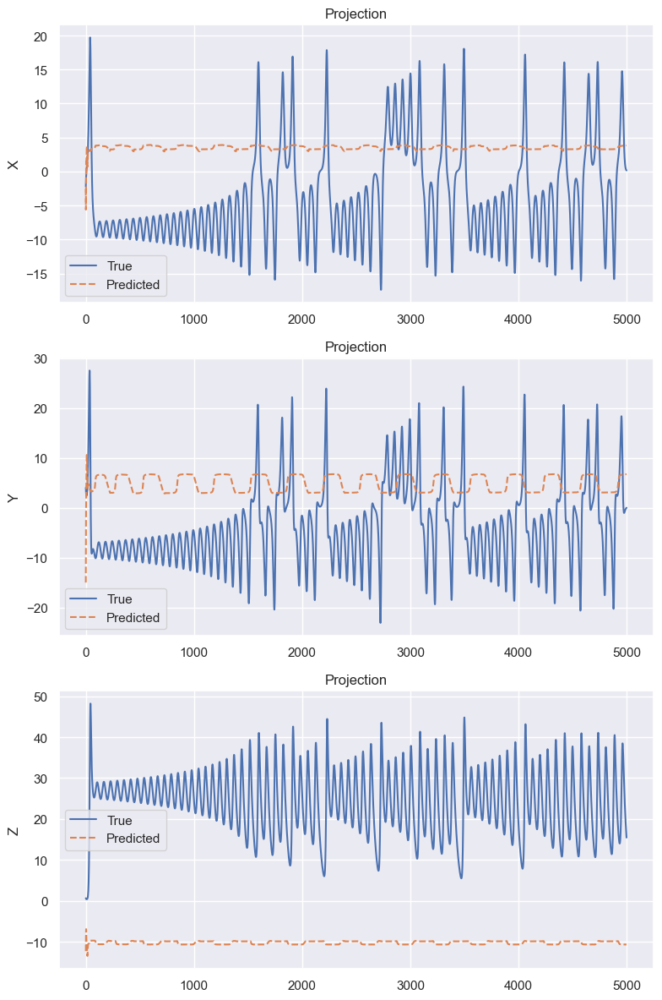

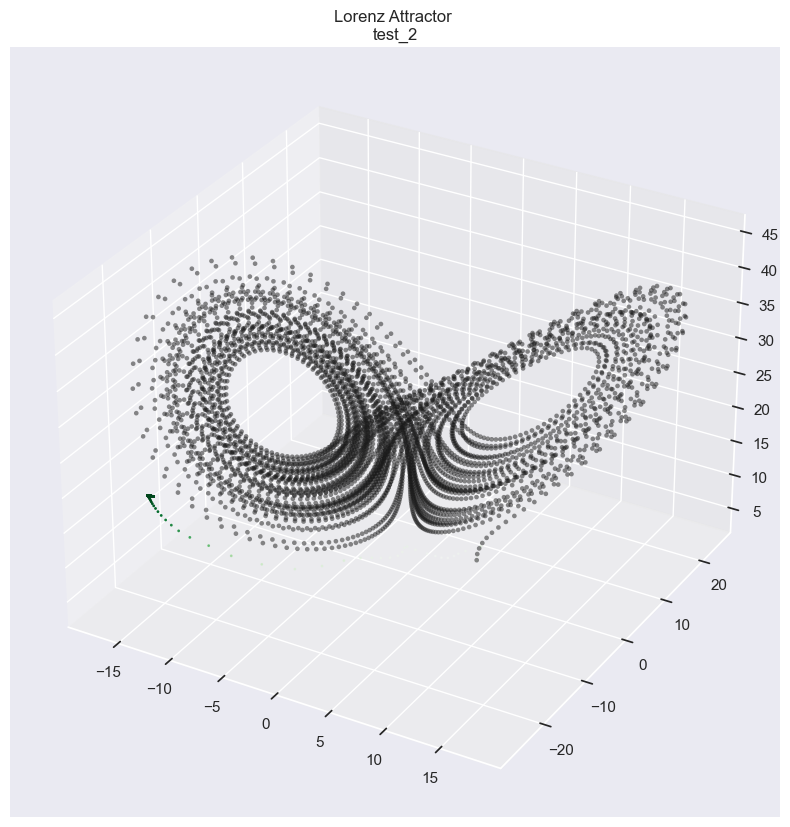

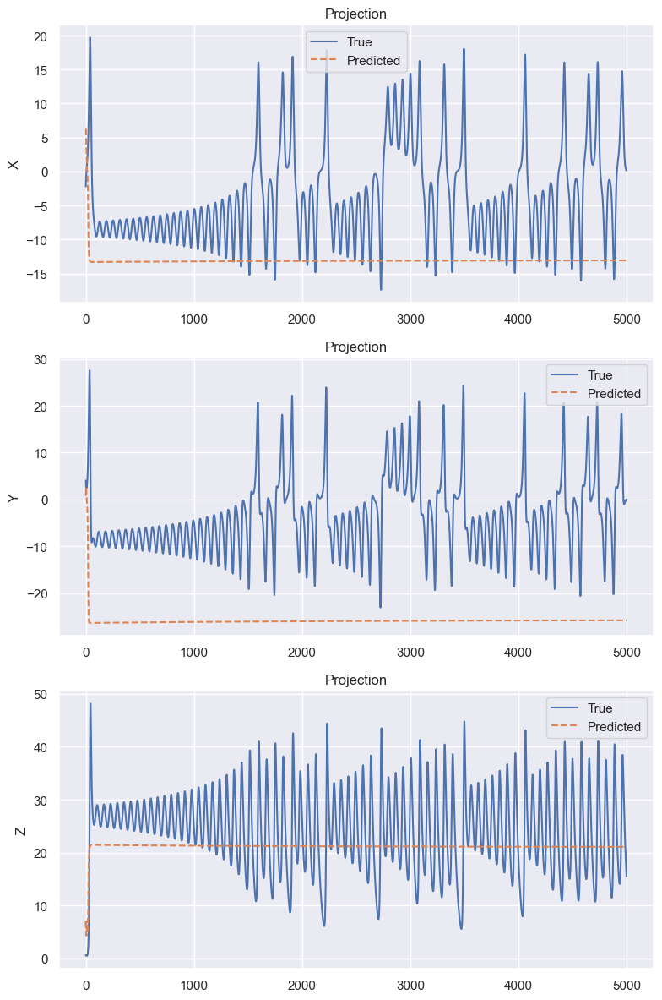

In [667]:
test_predictions, test_losses = evaluate(test_model,test,label='test')

In [668]:
test_losses

[243.46930796221557, 465.43243505497367, 308.76888947486043]

In [572]:
torch.save(test_losses, 'test_losses_lstm.pt')

In [619]:
def plot_vector_field(predictions,label):
    for idx in range(len(predictions)):
        positions = predictions[idx][:, 0, :]  # Extracting the 3 components as positions

        # Create a new tensor with requires_grad=True
        positions = positions.clone().detach().requires_grad_(True)

        # Calculate the vector field by taking the derivatives of positions
        vector_field = torch.autograd.grad(positions, positions, torch.ones_like(positions), create_graph=True)[0]

        # Extract the x, y, and z components of the vector field
        U = vector_field[:, 0]
        V = vector_field[:, 1]
        W = vector_field[:, 2]

        # Move tensors to CPU before converting to NumPy arrays
        positions = positions.cpu().detach().numpy()
        U = U.cpu().detach().numpy()
        V = V.cpu().detach().numpy()
        W = W.cpu().detach().numpy()

        # Create a subset of positions for the arrows
        arrow_step = 1  # Adjust this to change the density of arrows
        arrow_positions = positions[::arrow_step]

        # Calculate arrow directions by normalizing the vector field components
        magnitude = np.sqrt(U**2 + V**2 + W**2)
        arrow_U = U / magnitude
        arrow_V = V / magnitude

        # Plot the vector field with arrows
        fig, ax = plt.subplots(figsize=(4, 4))
        ax.quiver(arrow_positions[:, 0], arrow_positions[:, 1], arrow_U[::arrow_step], arrow_V[::arrow_step], width=0.004, alpha=0.6)
        ax.set_xticks([])  # Remove x-axis ticks
        ax.set_yticks([])  # Remove y-axis ticks
        ax.set_xlabel('')   # Remove x-axis label
        ax.set_ylabel('')   # Remove y-axis label
        plt.title(f'Lorenz LSTM Vector Field of {label}_{idx}  Predictions')
        plt.savefig(f'PNG/LSTM/lorenz_LSTM_Vector_Field_{label}_{idx}.png', format='png', dpi=400, bbox_inches ='tight', pad_inches = 0.1)
        plt.tight_layout()
        plt.show()

In [611]:
test_predictions = torch.stack(test_predictions)

In [612]:
test_predictions.shape

torch.Size([3, 1, 5000, 3])

In [613]:
test_predictions = test_predictions.squeeze(1).unsqueeze(2)

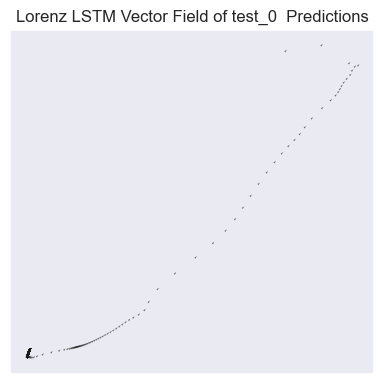

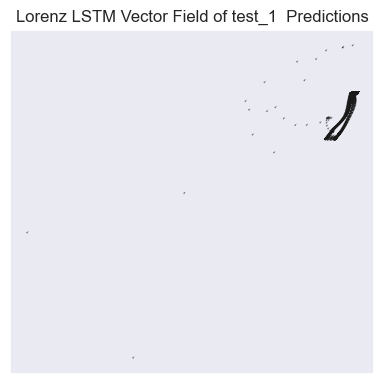

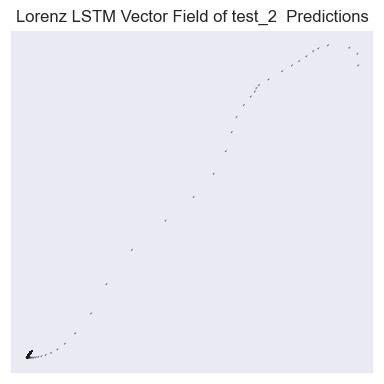

In [620]:
plot_vector_field(test_predictions,label='test')

In [621]:
train.shape

torch.Size([30000, 1, 3])

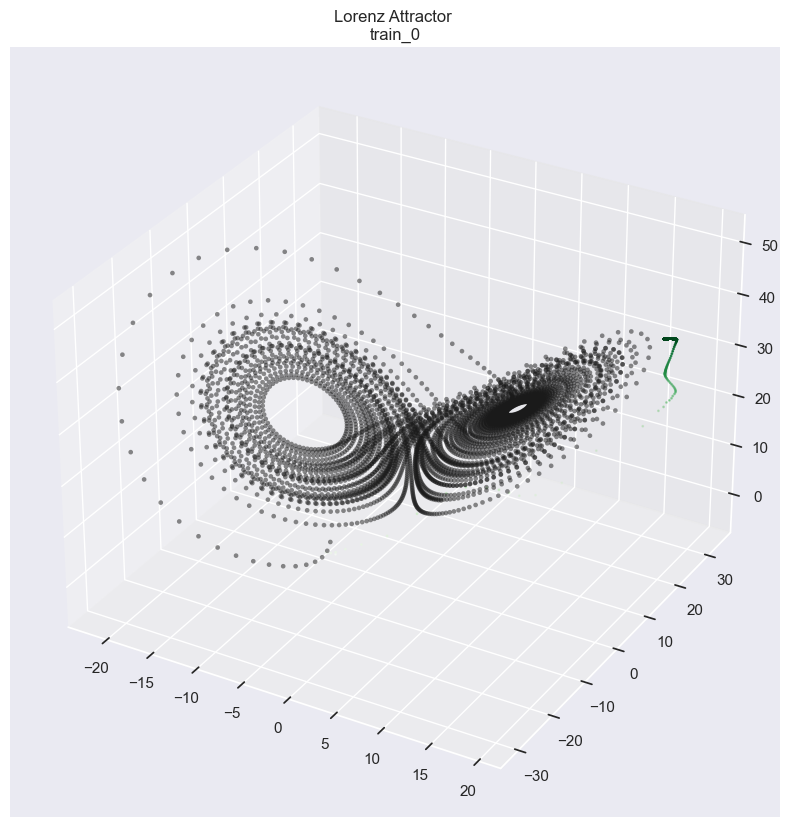

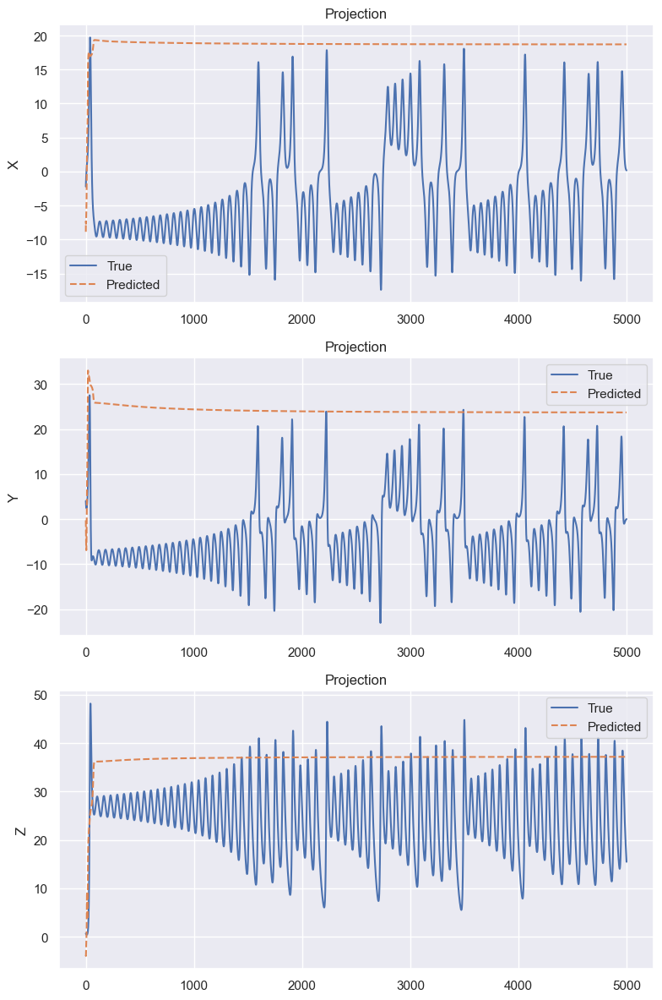

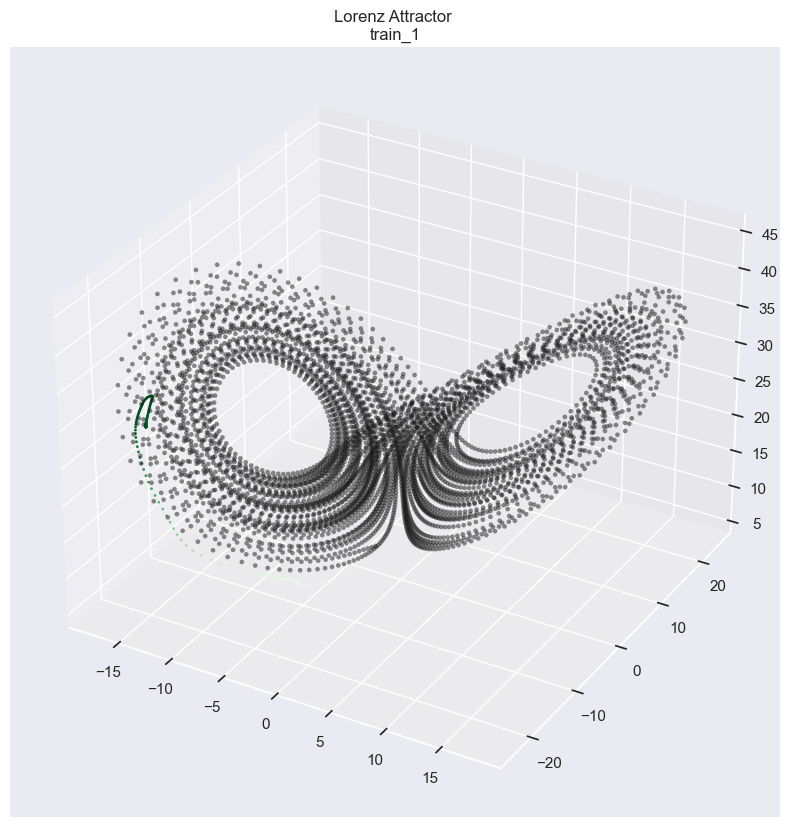

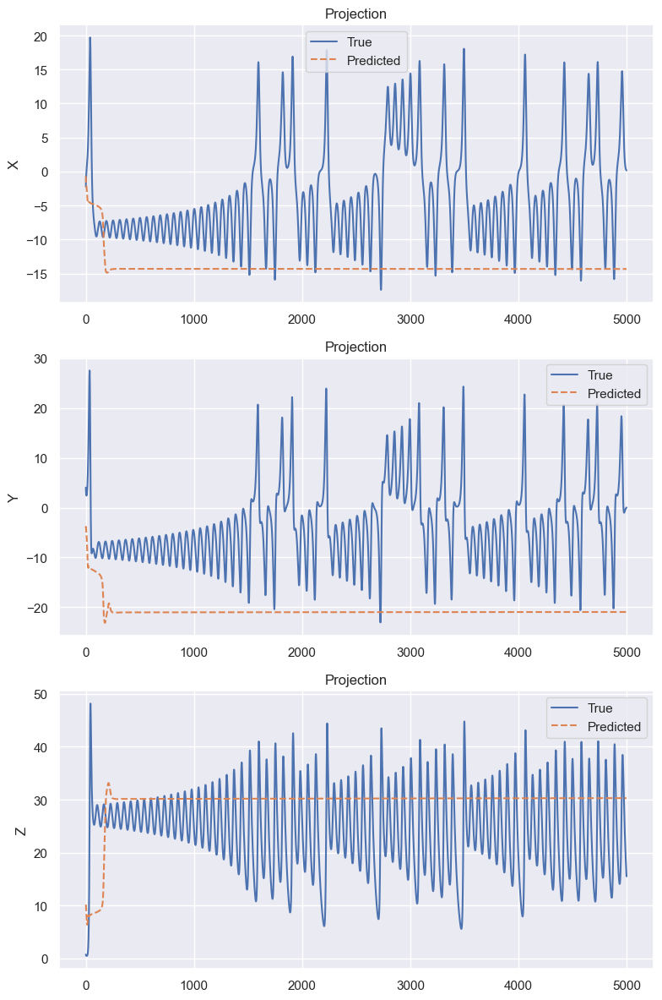

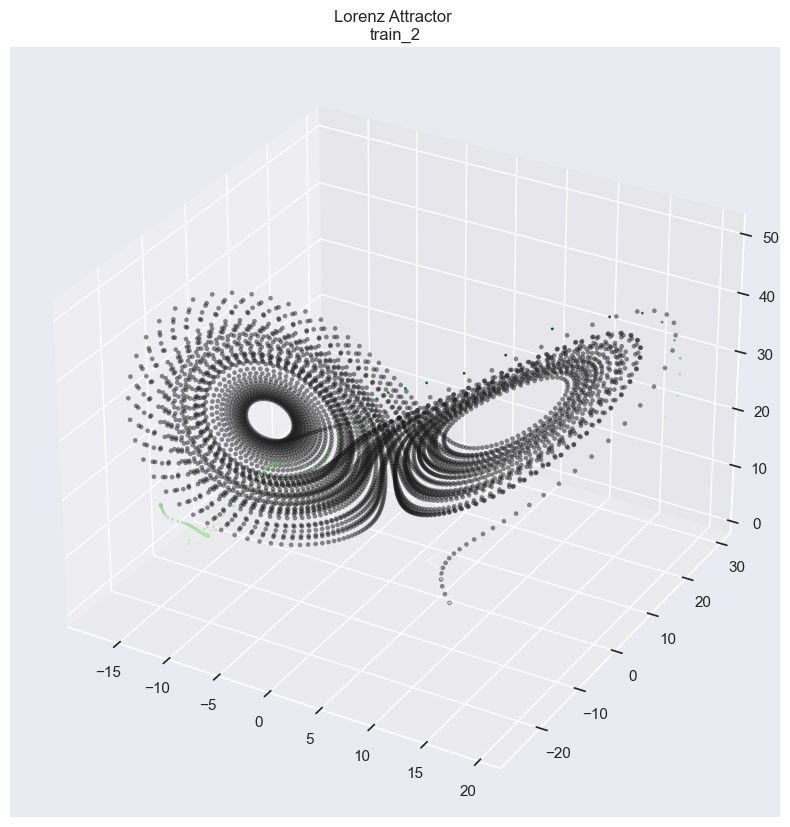

...

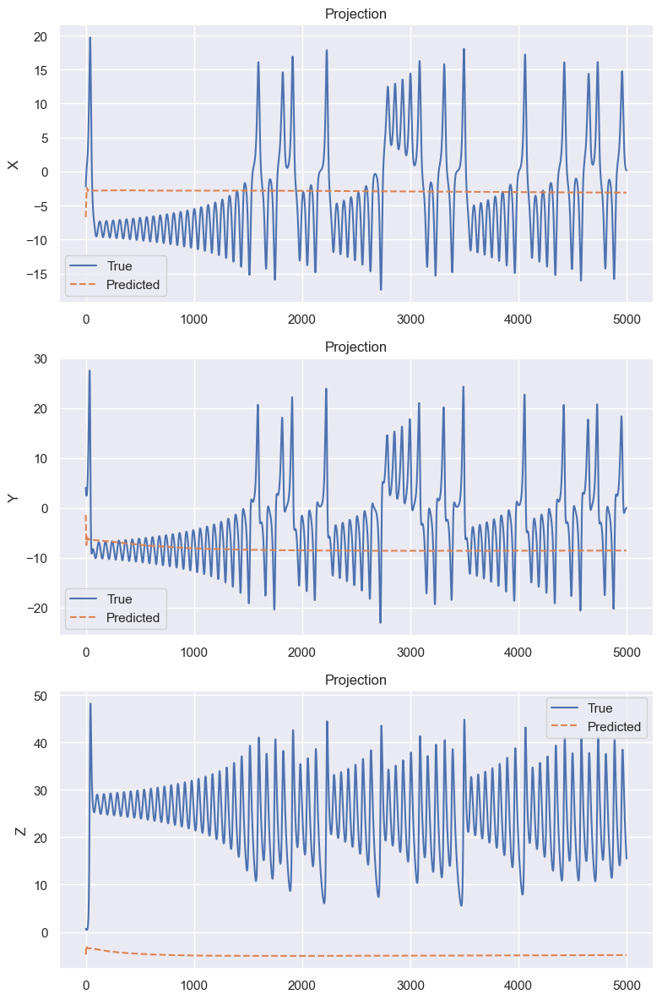

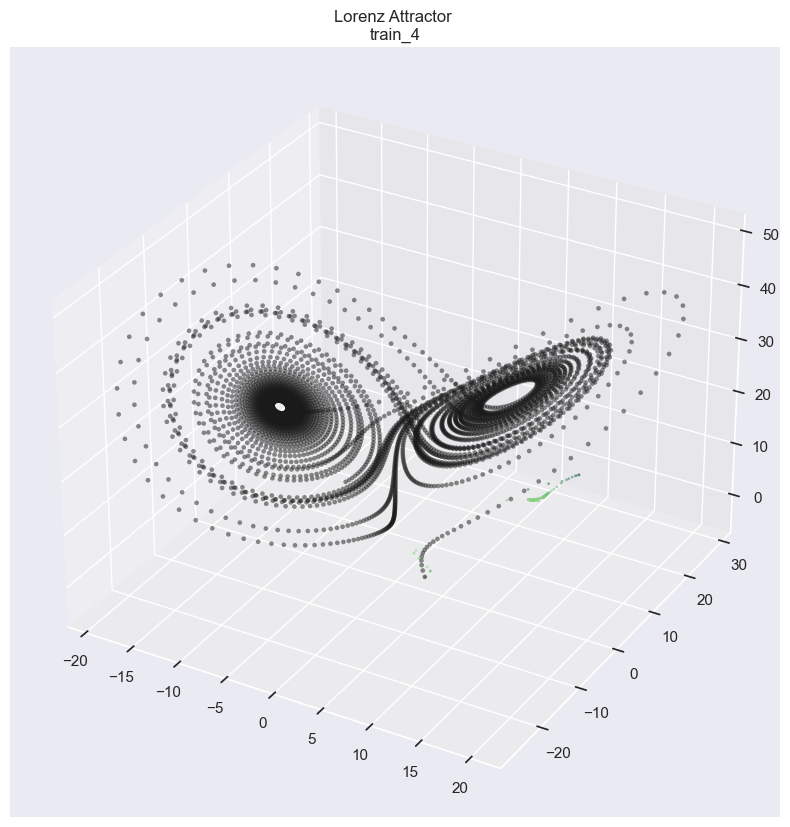

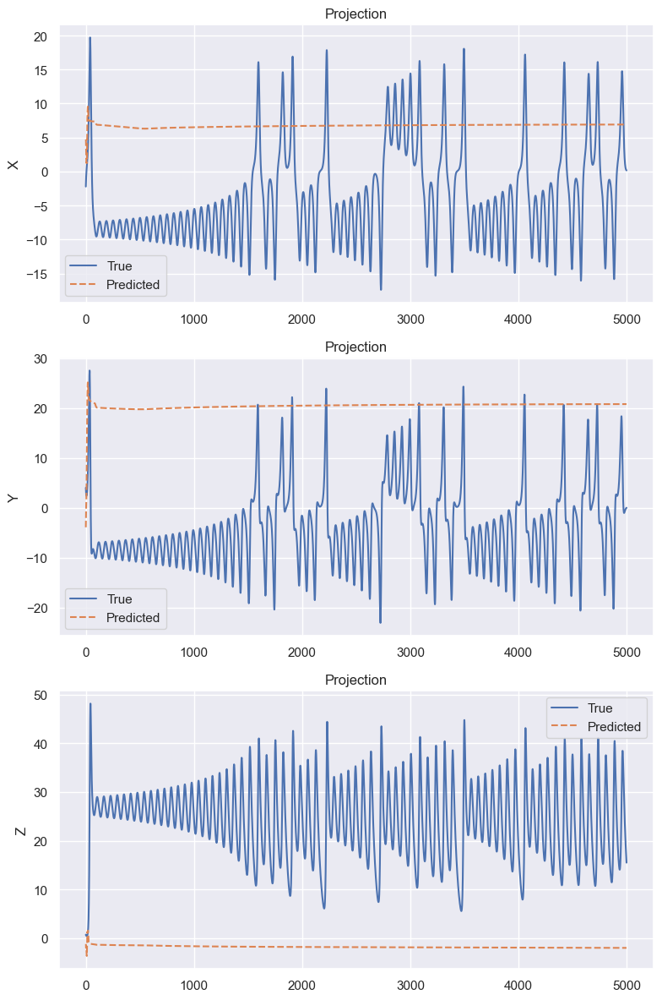

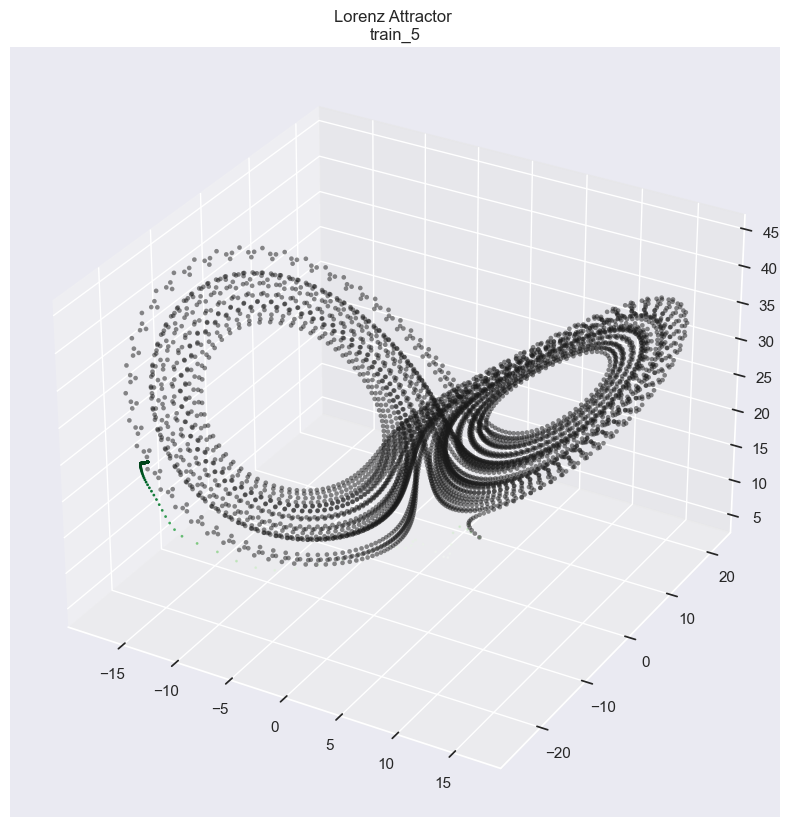

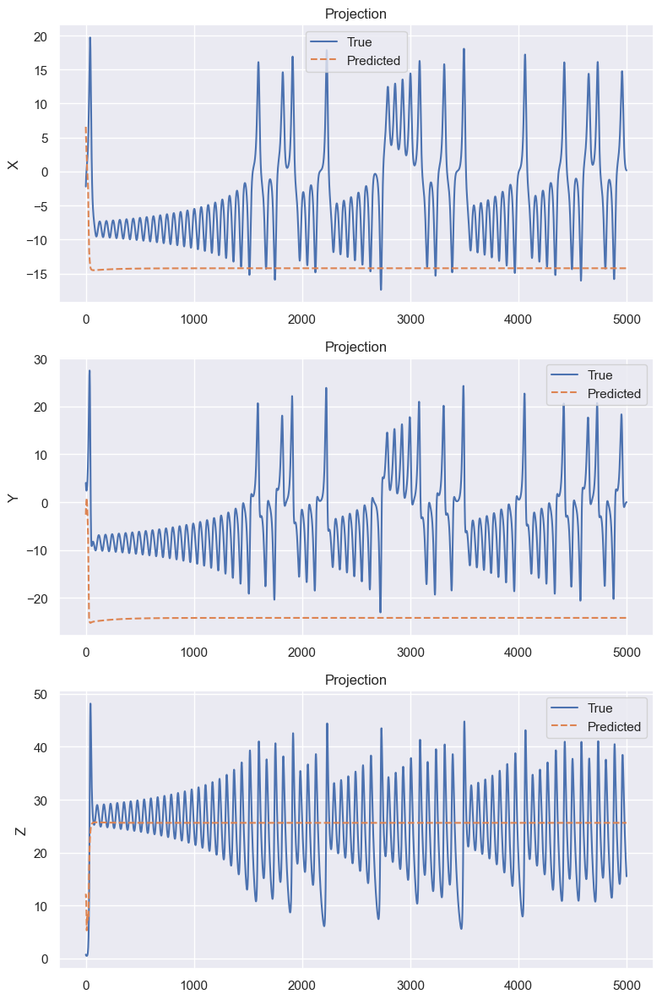

In [623]:
tr_predictions, tr_losses = evaluate(test_model,data_tensor[:6],label='train')

In [624]:
tr_losses

[373.00387679912325,
 268.8080989262842,
 295.59738210385717,
 401.15884707612645,
 486.5176197907601,
 378.48584000869937]

In [625]:
tr_predictions = torch.stack(tr_predictions)

In [626]:
tr_predictions = tr_predictions.squeeze(1).unsqueeze(2)

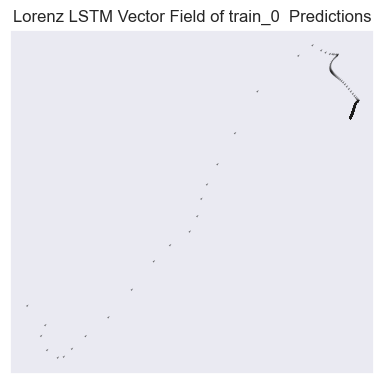

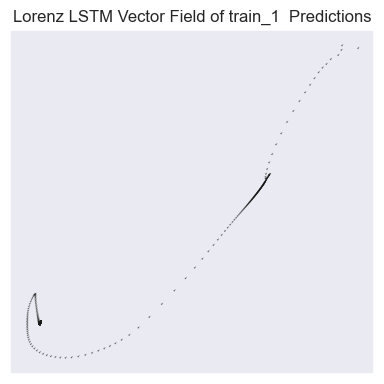

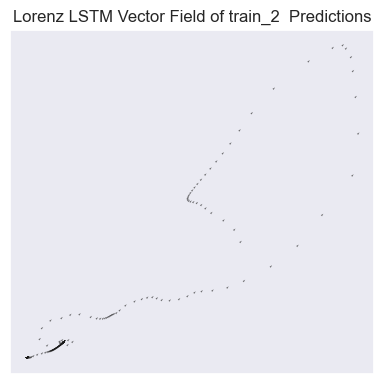

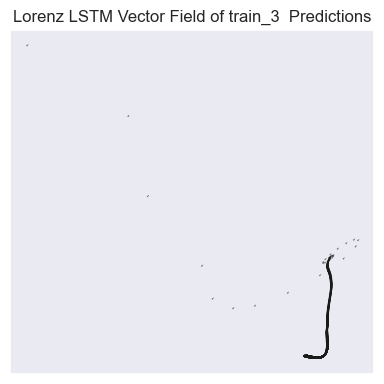

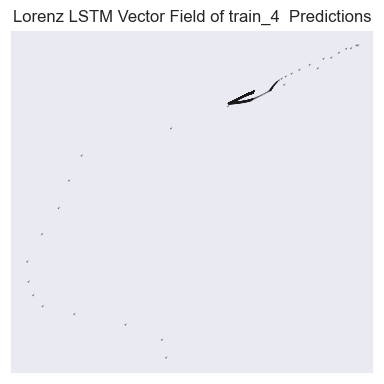

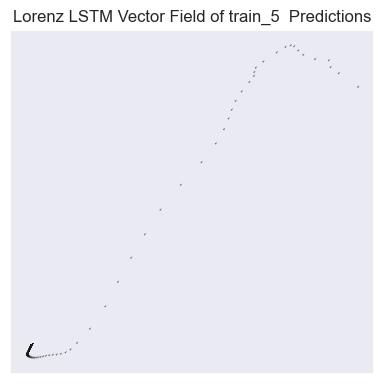

In [627]:
plot_vector_field(tr_predictions,label='train')